In [1]:
# Import packages
import os
import cv2
import numpy as np
import tensorflow as tf
import sys


# Ignore the warnings if any
import warnings  
warnings.filterwarnings('ignore')

from matplotlib import pyplot as plt
from PIL import Image

#sys.path.append("/home/redne/Tensorflow/models")
#sys.path.append("/home/redne/Tensorflow/models/research")
#sys.path.append("/home/redne/Tensorflow/models/research/slim")
#sys.path.append("/home/redne/Tensorflow/cocoapi/PythonAPI")
# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("/home/redne/Tensorflow/models/research/object_detection")

# Import utilites
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

from model_eval_util import load_image_into_numpy_array, run_inference_for_single_image


# This is needed to display the images.
%matplotlib inline


/home/redne/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/redne/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/redne/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/redne/anaconda3/envs/tf/lib/python3.6/site-packages/ten

__Mount Storage Account__

### Configs 

#### Core_Min

#### Core_EXP

In [3]:
#os.listdir(path="../mnt/zerowaste_blob/project_zero/experiments/ds0_v1/")
os.listdir(path="../mnt/zerowaste_blob/project_zero/experiments/ds01_v1/")

['ds01_v1_052420.csv',
 'ds01_v1_dataset_052420.csv',
 'ds1v0_frcnn_incpetionv2_060220_step50k',
 'ds1v0_frcnn_iresnetv2_060220_step50k',
 'ds1v0_frcnn_resnet50_060220_step50k',
 'ds1v0_ssdlitev2_060220_step20k',
 'labelmap.pbtxt',
 'test.tfrecord',
 'test_labels.csv',
 'train.tfrecord',
 'train_labels.csv',
 'val.tfrecord',
 'val_labels.csv']

In [13]:
MODEL_PATH_ROOT = "../mnt/zerowaste_blob/project_zero/experiments/ds01_v1/"
#MODEL_PATH = "ssdlite_v2_core_min_022920/"
MODEL_PATH = "ds1v0_frcnn_resnet50_060220_step50k/" # "ds0_v1_ssdlitev2_bc01_052420_step20k/"

PATH_TO_CKPT = MODEL_PATH_ROOT + MODEL_PATH + "frozen_inference_graph.pb"


PATH_TO_LABELS =  MODEL_PATH_ROOT +  "labelmap.pbtxt"

NUM_CLASSES = 5

__PATH TO IMAGES__

In [14]:
import glob
#PATH_TO_TEST_IMAGES_DIR = '../test_images'
PATH_TO_TEST_IMAGES_DIR = './ds01_test'
TEST_IMAGE_PATHS = glob.glob(PATH_TO_TEST_IMAGES_DIR + "/" + '*.jpg')

# Size, in inches, of the output images.
IMAGE_SIZE = (20, 15)


TEST_IMAGE_PATHS[:5]

['./ds01_test/coffee_cup01_lunch03_592.jpg',
 './ds01_test/ms_clear_cup_lunch07_1394.jpg',
 './ds01_test/lunch07_1409.jpg',
 './ds01_test/lunch07_1631.jpg',
 './ds01_test/lunch07_1635.jpg']

In [15]:
# Load the label map.
# Label maps map indices to category names, so that when our convolution
# network predicts `5`, we know that this corresponds to `king`.
# Here we use internal utility functions, but anything that returns a
# dictionary mapping integers to appropriate string labels would be fine
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [16]:
# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)

__ds1v0_frcnn_resnet50_060220_step50k__

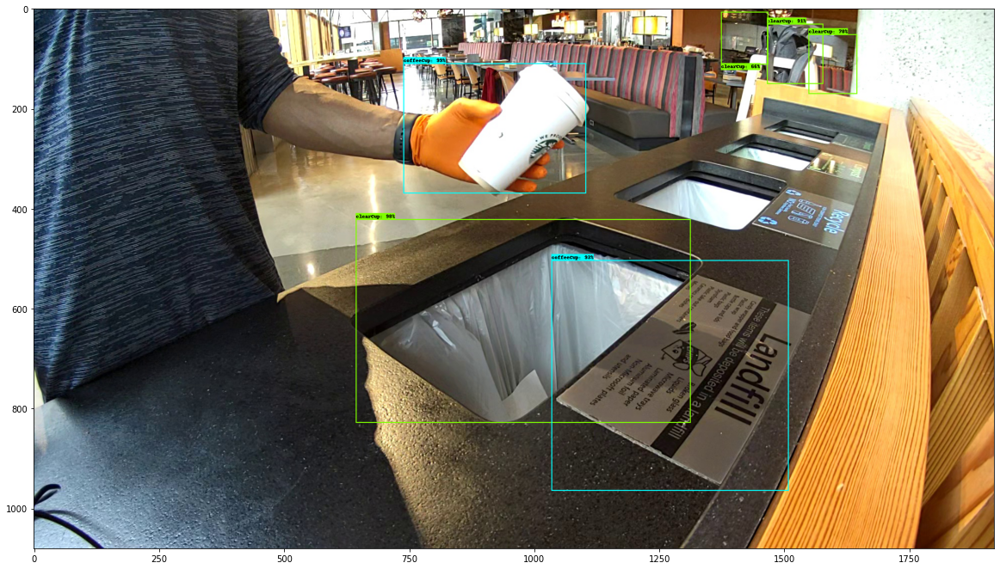

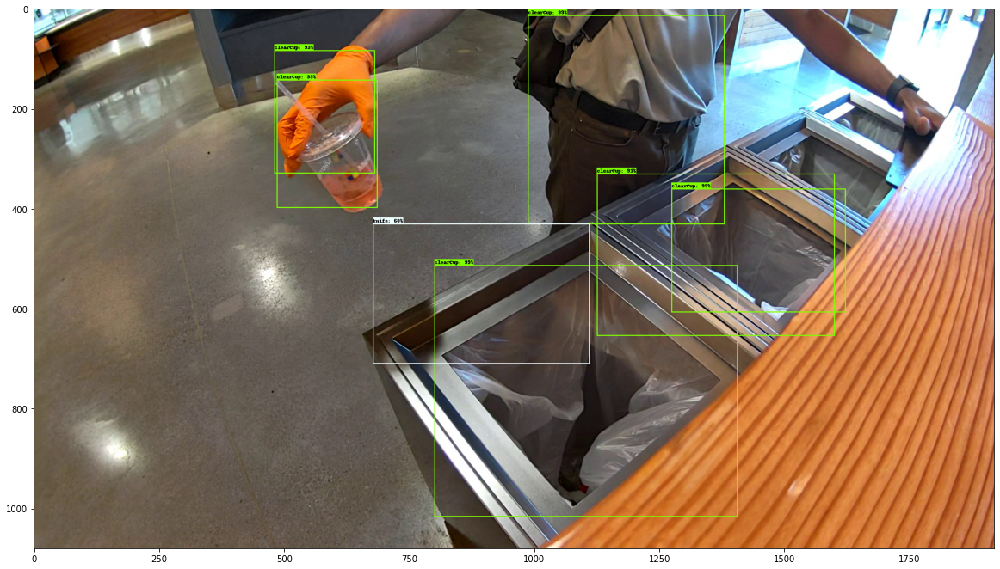

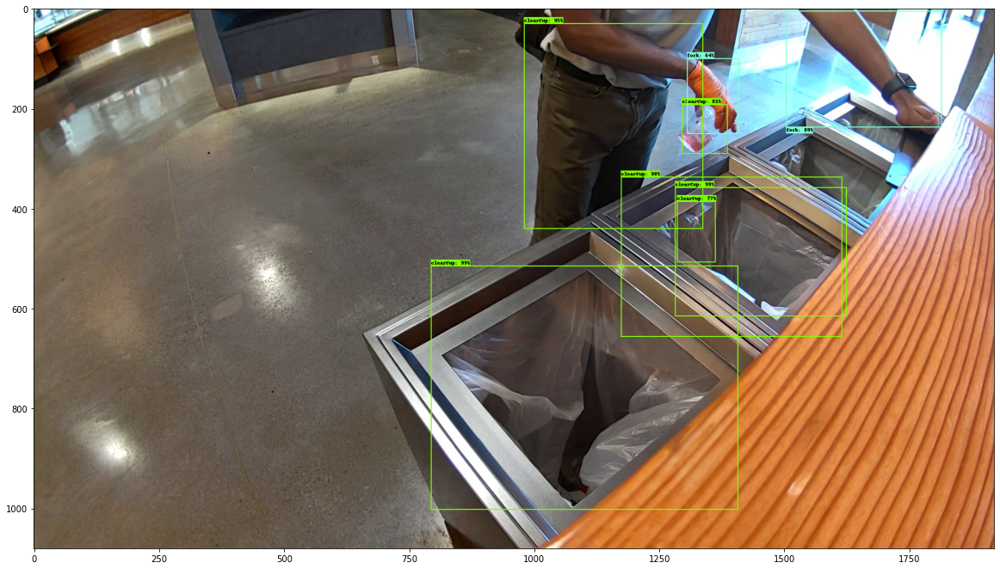

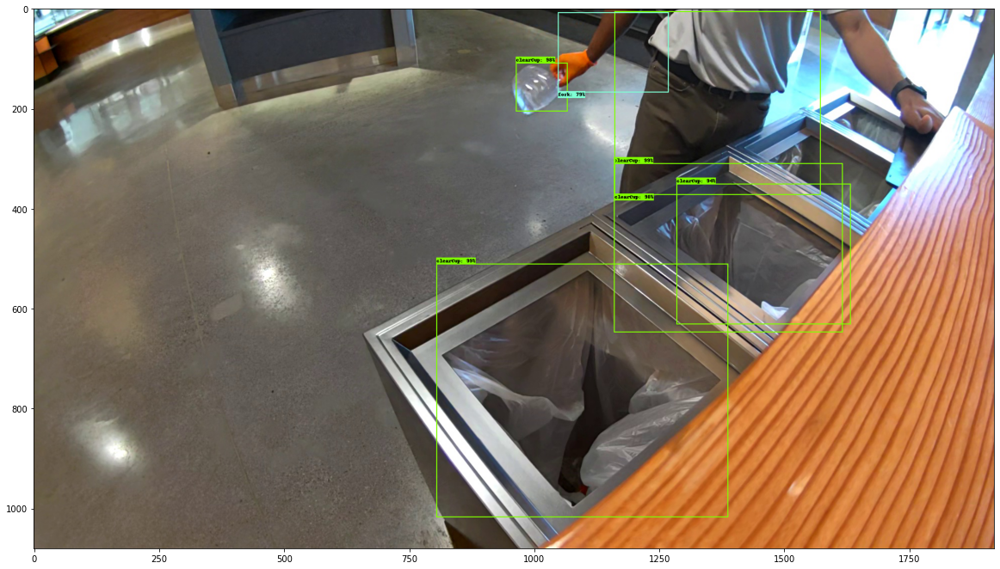

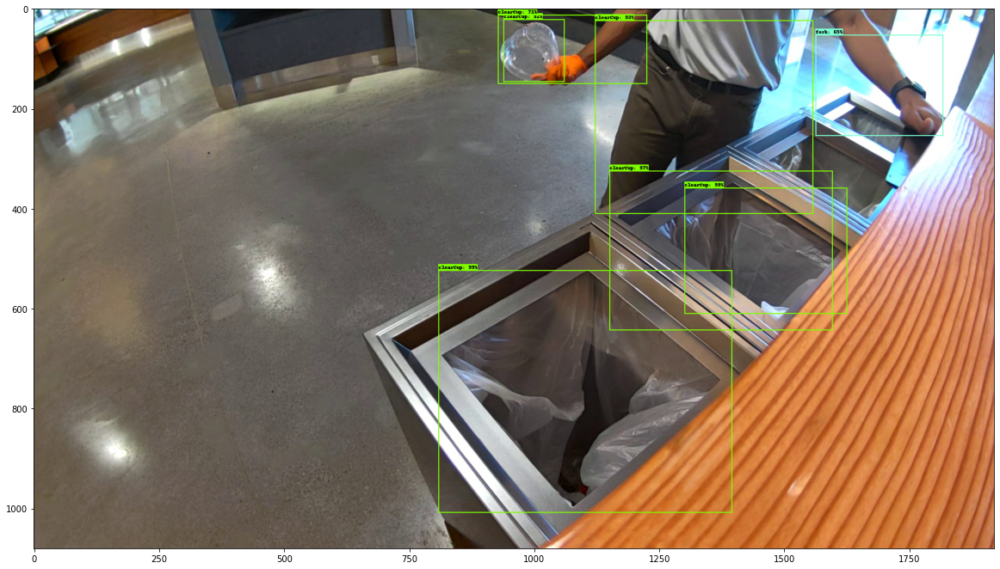

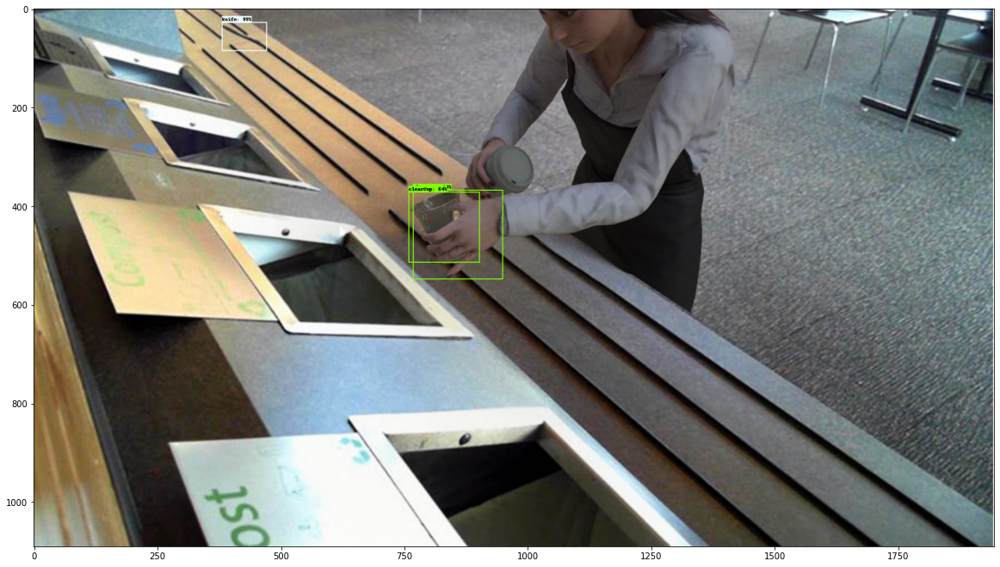

In [17]:
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=2,
      min_score_thresh=0.6)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)

__SSDLITE__

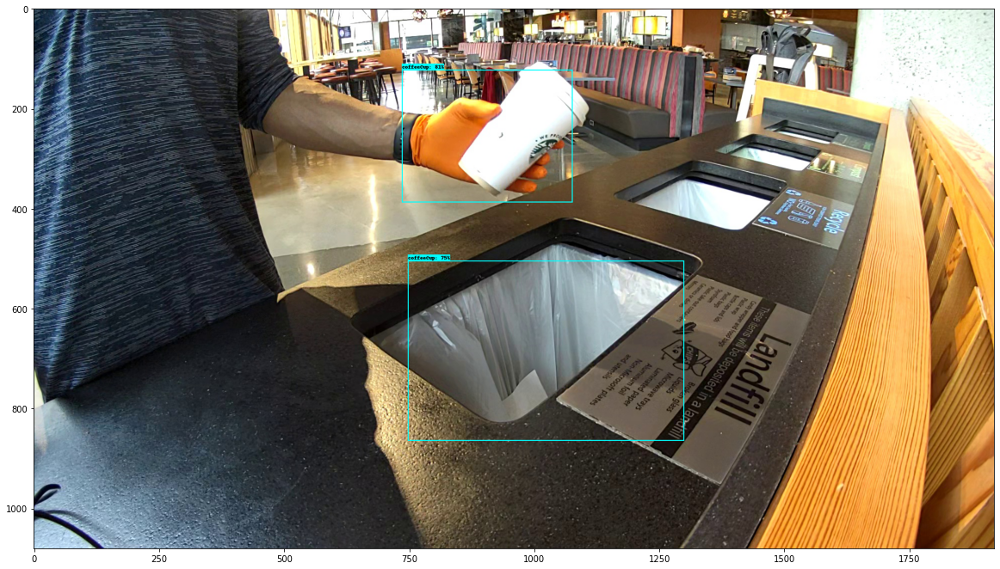

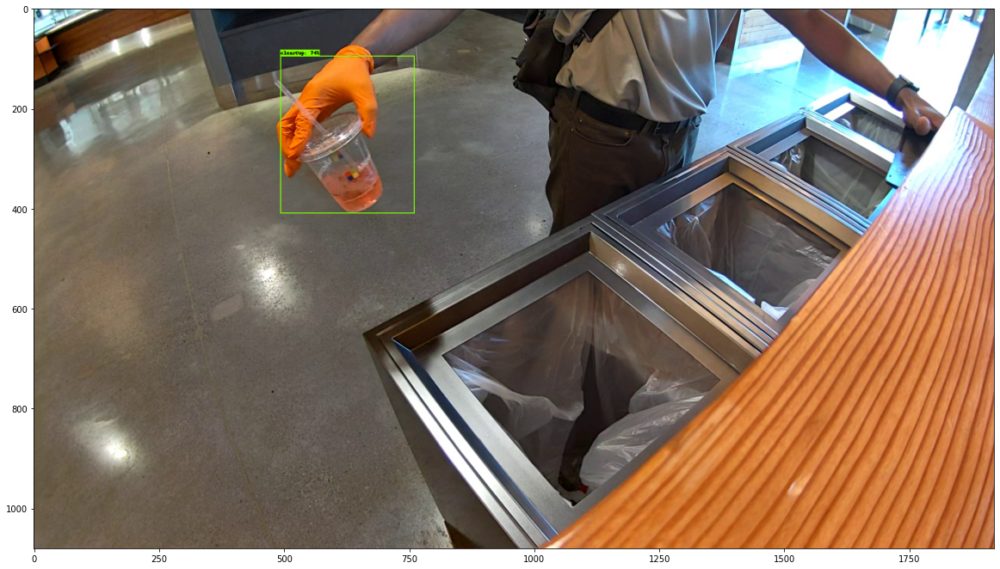

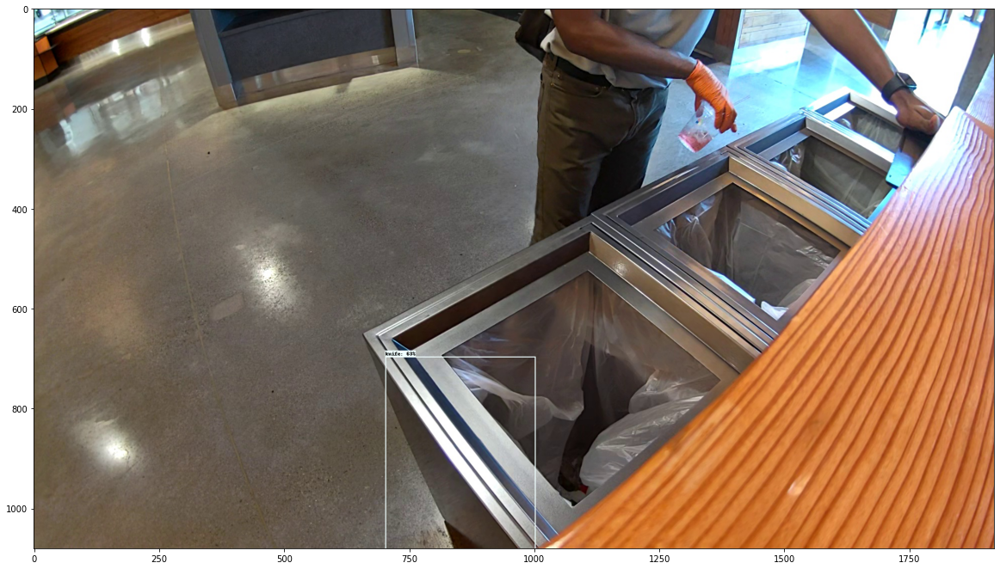

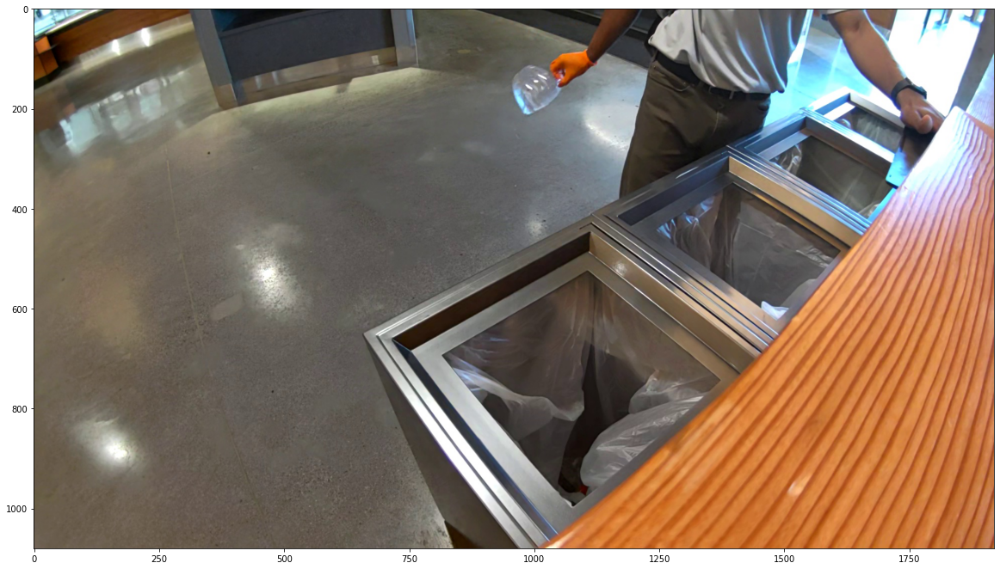

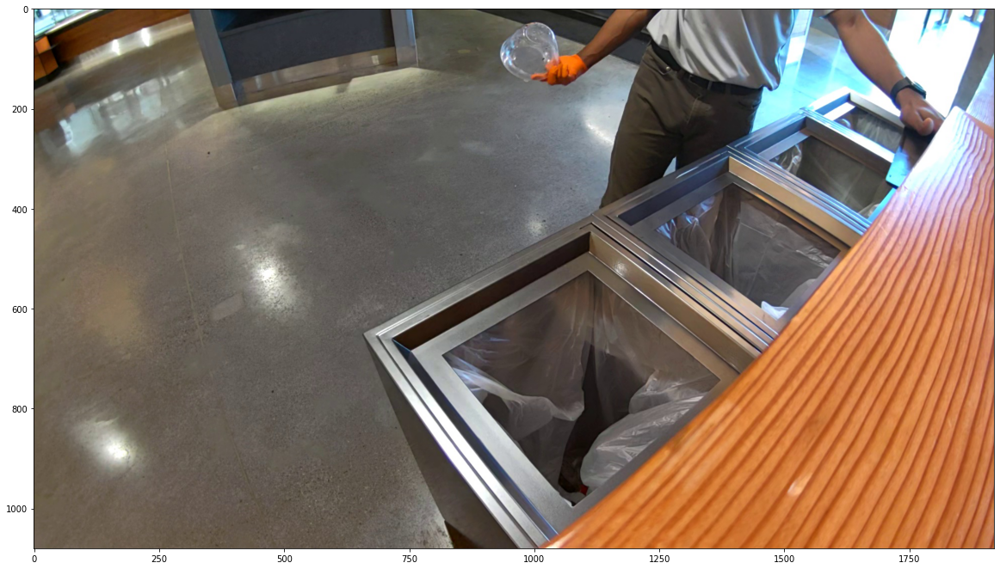

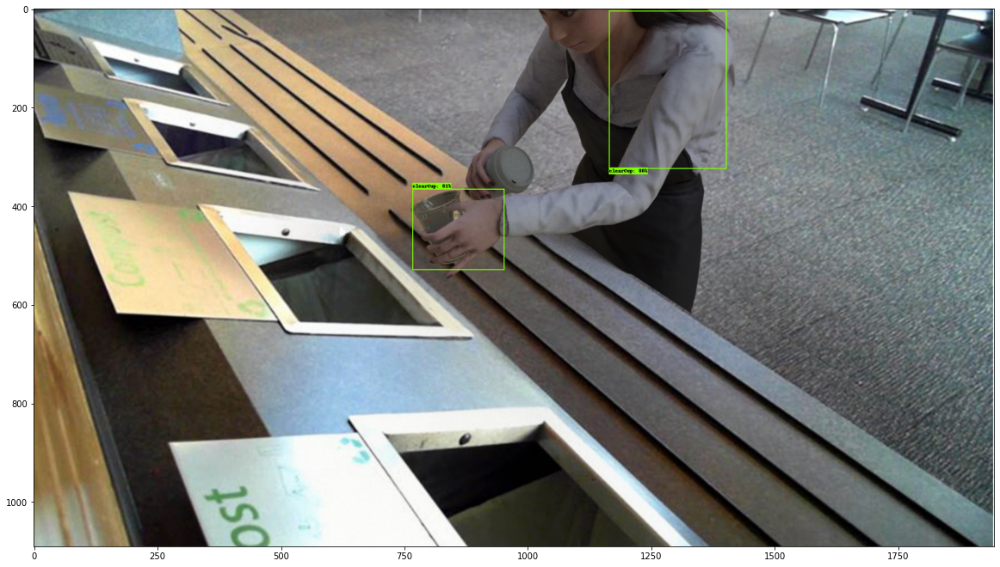

In [12]:
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=2,
      min_score_thresh=0.6)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)